# Analyze CITE-seq data of CXCR3+ B cells in MS

In [78]:
import numpy as np
import pandas as pd
import scanpy as sc
import muon as mu
from muon import prot as pt
import scvi
from matplotlib import pyplot as plt
import seaborn as sns
import anndata as ad
import matplotlib

In [2]:
# load data
data_dir = '../data/Gallopin_et_al/raw'
mdata = mu.read_10x_mtx(data_dir)


In [3]:
# prepare md
md_dict = {'1':'Patient Placebo N1 J0', '2': 'Patient Placebo N1 M3', '3': 'Patient Placebo N2 J0', '5': 'Patient Placebo N2 M3, GEX', '12': 'Patient Placebo N3 J0',
           '15': 'Patient Placebo N3 M3', '17': 'Patient Placebo N4 J0', '19': 'Patient Placebo N4 M3', '8': 'Patient Placebo N5 J0', '10': 'Patient Placebo N5 M3',
           '7': 'Patient Vitamin D N1 J0', '9': 'Patient Vitamin D N1 M3', '4': 'Patient Vitamin D N2 J0', '6': 'Patient Vitamin D N2 M3', '11': 'Patient Vitamin D N3 J0',
            '14': 'Patient Vitamin D N3 M3', '13': 'Patient Vitamin D N4 J0', '16': 'Patient Vitamin D N4 M3', '18': 'Patient Vitamin D N5 J0', '20': 'Patient Vitamin D N5 M3'}
mdata.obs['sample_id'] = mdata.obs_names.str.split('-').str[1]
mdata.obs['sample_name'] = mdata.obs['sample_id'].map(md_dict)
mdata.obs['condition'] = ['control' if sample else 'vitamin d' for sample in mdata.obs['sample_name'].str.startswith('Patient Placebo')]

In [4]:
# store counts in layer and normalize
mdata['prot'].layers['counts'] = mdata['prot'].X.copy()
pt.pp.clr(mdata['prot'])

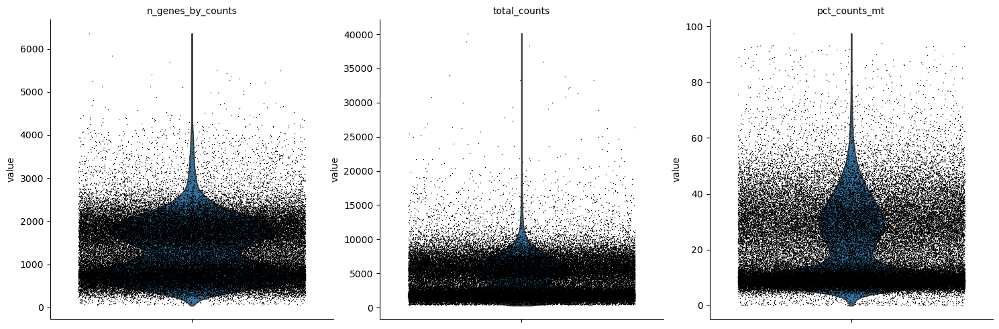

In [5]:
# preprocess RNA and filter cells
mdata['rna'].var['mt'] = mdata['rna'].var_names.str.startswith('MT-') 
sc.pp.calculate_qc_metrics(mdata['rna'], qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pl.violin(mdata['rna'], ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'], jitter=0.4, multi_panel=True)

In [6]:
# filter
mu.pp.filter_var(mdata['rna'], 'n_cells_by_counts', lambda x: x >= 3)
mu.pp.filter_obs(mdata['rna'], 'n_genes_by_counts', lambda x: x >= 500)
mu.pp.filter_obs(mdata['rna'], 'pct_counts_mt', lambda x: x < 17)

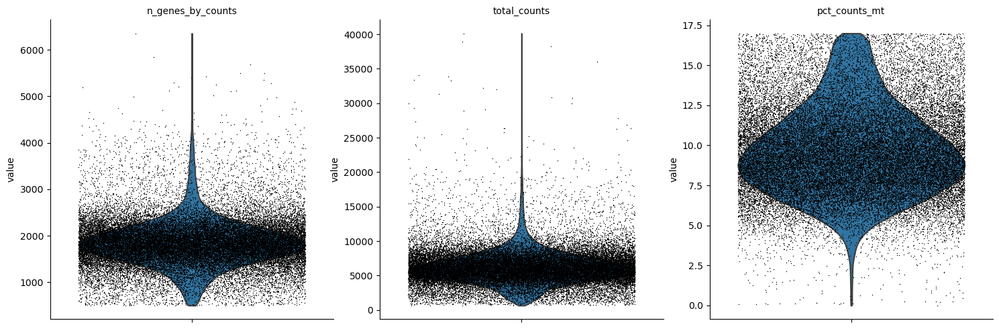

In [7]:
sc.pl.violin(mdata['rna'], ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

In [8]:
# save count layer
mdata['rna'].layers['counts'] = mdata['rna'].X.copy()
sc.pp.normalize_total(mdata['rna'], target_sum=1e4)
sc.pp.log1p(mdata['rna'])

In [9]:
mdata['rna']

AnnData object with n_obs × n_vars = 37645 × 25451
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'log1p'
    layers: 'counts'

In [10]:
# HVG and PCA
sc.pp.highly_variable_genes(mdata['rna'])
sc.tl.pca(mdata['rna'])

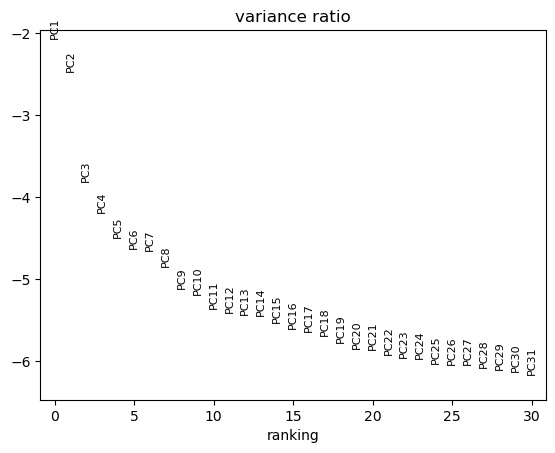

In [12]:
# plot variance ratio of PCs
sc.pl.pca_variance_ratio(mdata['rna'], log=True)

In [13]:
# compute umap
sc.pp.neighbors(mdata['rna'], n_pcs=20)
sc.tl.umap(mdata['rna'])

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


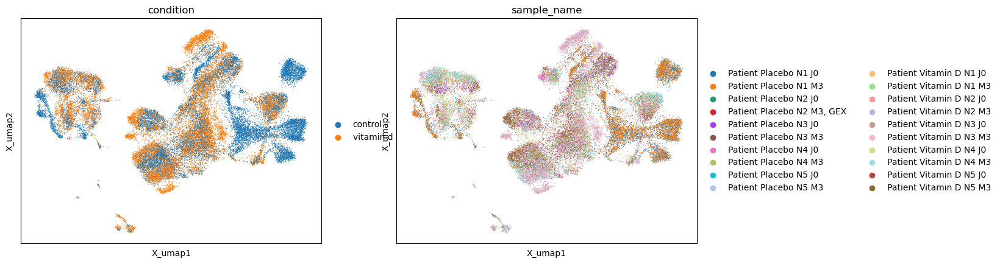

In [14]:
# visualize
mu.pl.embedding(mdata, basis= 'rna:X_umap', color=['condition', 'sample_name'])

In [15]:
# intersect
mu.pp.intersect_obs(mdata)

# integrate data using SCVI

In [16]:
adata = mdata['rna']
adata.obs = mdata.obs

In [17]:
# subset on HVG
sc.pp.highly_variable_genes(
    adata,
    n_top_genes=5000,
    subset=True,
    layer="counts",
    flavor="seurat_v3",
    batch_key="sample_name",
)

In [ ]:
# set up model and train
scvi.model.SCVI.setup_anndata(
    adata,
    layer="counts",
    batch_key="sample_name"
)

train_kwargs = {
        "max_epochs": 300,
        "early_stopping": True,
        "early_stopping_patience": 30,
        "check_val_every_n_epoch": 1,
        "early_stopping_monitor": "elbo_validation"}

model = scvi.model.SCVI(adata)
model.train(**train_kwargs)

In [21]:
# save model and adata
# model.save('../models/2023-12-14_SCVI')
model = scvi.model.SCVI.load('../models/2023-12-14_SCVI', adata = adata)

INFO     File ../models/2023-12-14_SCVI/model.pt already downloaded                                                


Training will be faster when sparse matrix is formatted as CSR. It is safe to cast before model initialization.


Text(0, 0.5, 'elbo_validation')

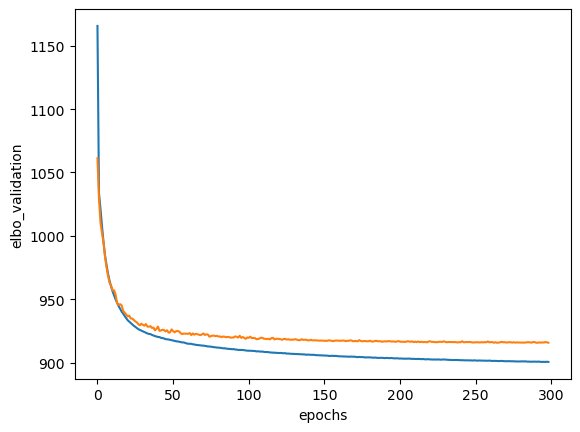

In [22]:
# plot elbo over epochs
plt.plot(model.history['elbo_train'])
plt.xlabel('epochs')
plt.ylabel('elbo_train')

plt.plot(model.history['elbo_validation'])
plt.xlabel('epochs')
plt.ylabel('elbo_validation')

In [23]:
# get latent space
adata.obsm['X_scvi'] = model.get_latent_representation(adata)

SparseDataset is deprecated and will be removed in late 2024. It has been replaced by the public classes CSRDataset and CSCDataset.

For instance checks, use `isinstance(X, (anndata.experimental.CSRDataset, anndata.experimental.CSCDataset))` instead.

For creation, use `anndata.experimental.sparse_dataset(X)` instead.



In [24]:
# umap on scvi latent
sc.pp.neighbors(adata, use_rep='X_scvi')
sc.tl.umap(adata)

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


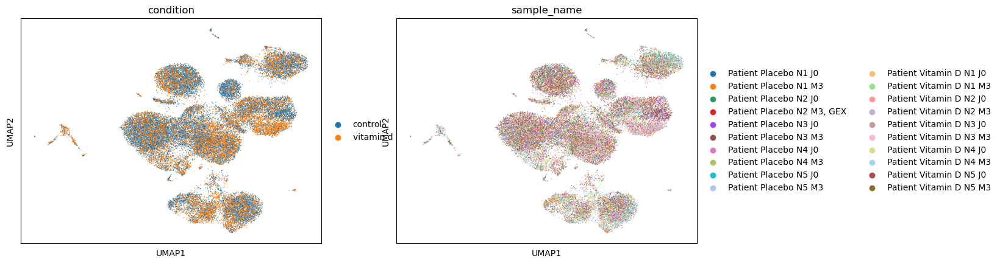

In [25]:
# plot umap
sc.pl.umap(adata, color=['condition', 'sample_name'])

In [60]:
# leiden on scvi latent
sc.tl.leiden(adata, resolution=1.2)

No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


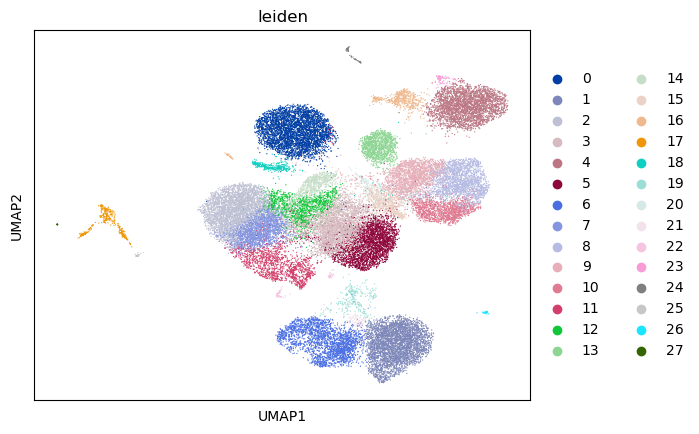

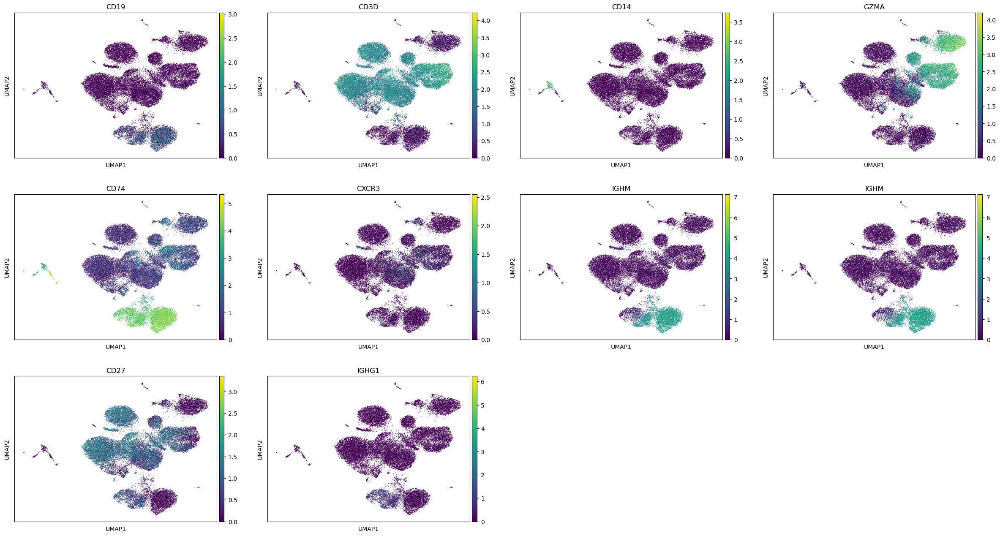

In [61]:
# plot umap
sc.pl.umap(adata, color=['leiden'])
sc.pl.umap(adata, color = ['CD19', 'CD3D', 'CD14', 'GZMA', 'CD74', 'CXCR3', 'IGHM', 'IGHM', 'CD27', 'IGHG1'])

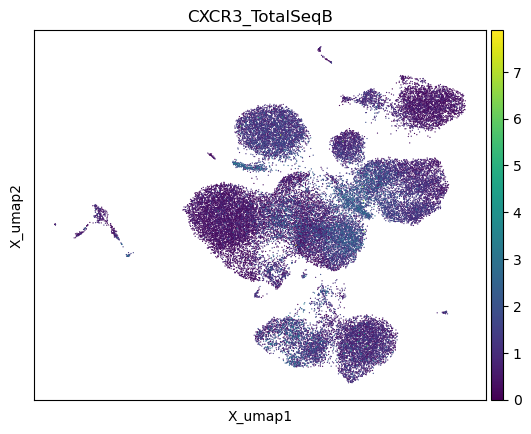

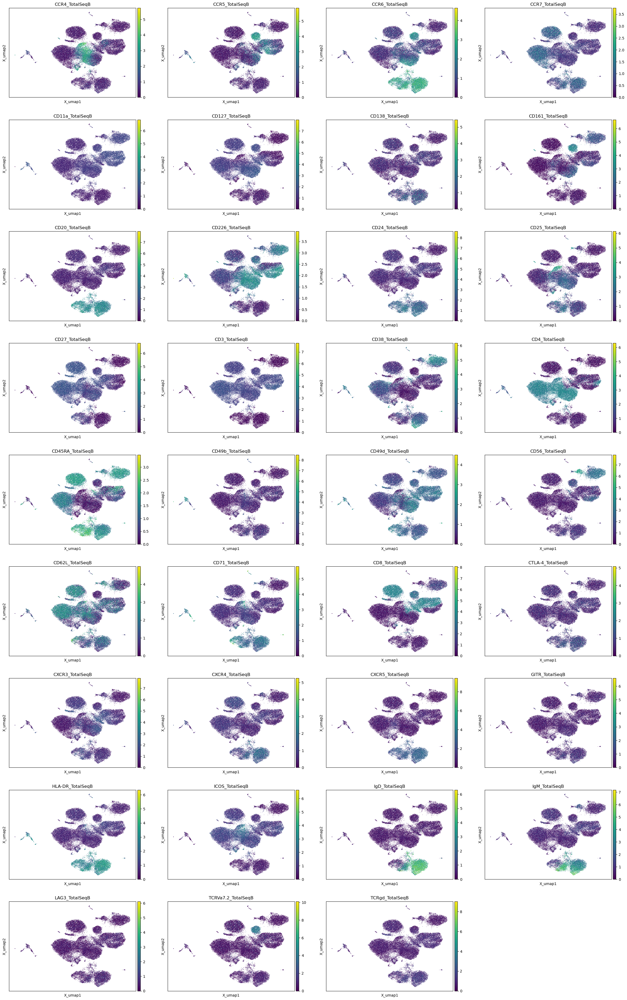

In [29]:
# plot protein expression
mu.pl.embedding(mdata, basis="rna:X_umap", color=["CXCR3_TotalSeqB"])
mu.pl.embedding(mdata, basis="rna:X_umap", color=mdata['prot'].var_names.to_list())

In a future version of pandas all arguments of Categorical.replace except for the argument 'value' will be keyword-only.
Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored


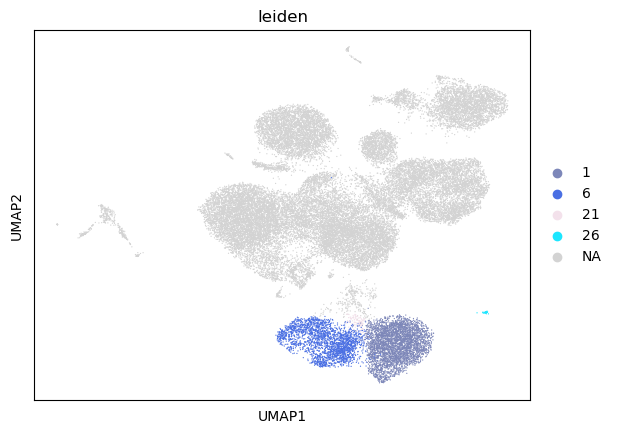

In [63]:
# Plot memory B cells
sc.pl.umap(adata, color=['leiden'], groups = ['26', '1', '21', '6'])

In [64]:
# subset B cells
mdata_Bmem = mdata.copy()
adata_Bmem = mdata_Bmem['rna']
adata_Bmem = adata_Bmem[adata_Bmem.obs['leiden'].isin(['6']), :]
# mu.pp.intersect_obs(mdata_Bmem)

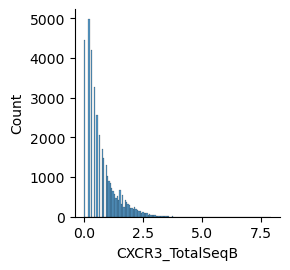

In [65]:
# visualize CXCR3 histogram
mu.pl.histogram(mdata_Bmem, keys='CXCR3_TotalSeqB')

In [66]:
# extract CXCR3 protein expression
loc_CXCR3 = mdata_Bmem['prot'].var_names.get_loc('CXCR3_TotalSeqB')
expr_CXCR3 = mdata['prot'][adata_Bmem.obs_names.to_list()].X[:,loc_CXCR3].toarray()



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751



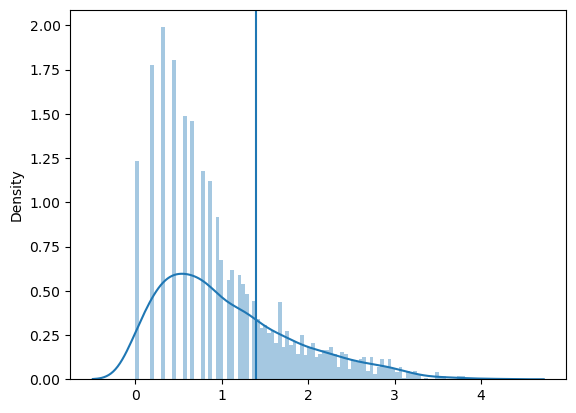

In [67]:
# determine positive fraction
thresh = 1.4
sns.distplot(expr_CXCR3, bins = 100)
plt.axvline(thresh, 0, 5)

In [68]:
# split cell subset column in CXCR3+ and CXCR3- B cells
adata_Bmem.obs['cell_subset'] = ['CXCR3 memory B cells' if expr > thresh else 'Memory B cells' for expr in expr_CXCR3]

Trying to modify attribute `.obs` of view, initializing view as actual.


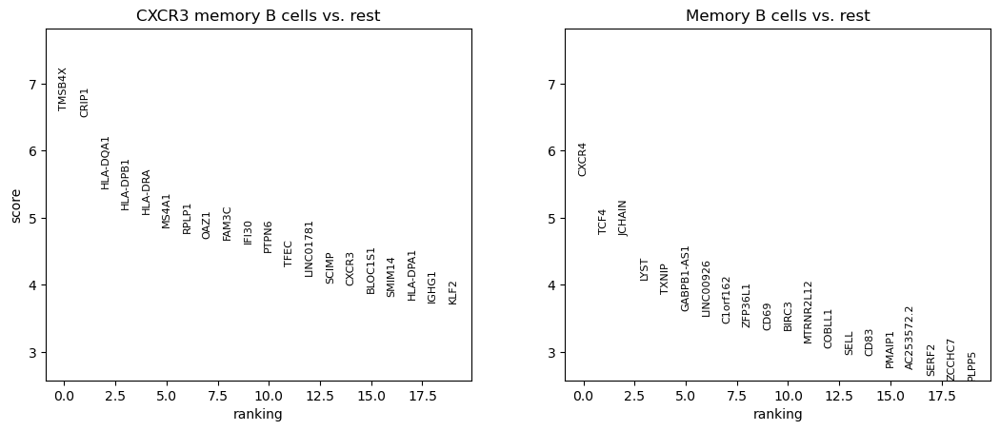

,names,scores,logfoldchanges,pvals,pvals_adj,pct_nz_group,pct_nz_reference
0,TMSB4X,6.609112,0.197840,3.866328e-11,1.933164e-07,1.000000,0.998856
1,CRIP1,6.504158,0.519092,7.812976e-11,1.953244e-07,0.891273,0.816362
4999,CXCR4,-5.626872,-0.412082,1.835065e-08,3.058442e-05,0.786838,0.853547
2,HLA-DQA1,5.446386,0.312843,5.140355e-08,6.425443e-05,0.971388,0.928490
3,HLA-DPB1,5.122182,0.186611,3.020202e-07,3.020202e-04,0.998569,0.996568
...,...,...,...,...,...,...,...
1716,NUPR2,0.055359,19.938713,9.558526e-01,1.000000e+00,0.001431,0.000000
1715,SIGLEC7,0.055359,20.269802,9.558526e-01,1.000000e+00,0.001431,0.000000
1714,AC024588.1,0.055359,19.962896,9.558526e-01,1.000000e+00,0.001431,0.000000
1721,EFHD1,0.055359,20.142988,9.558526e-01,1.000000e+00,0.001431,0.000000


In [178]:
# run DEG between CXCR3+ and neg Bmem
sc.tl.rank_genes_groups(adata_Bmem, groupby = 'cell_subset', method = 'wilcoxon', pts = True)
sc.pl.rank_genes_groups(adata_Bmem)
wilcox_df = sc.get.rank_genes_groups_df(adata_Bmem, group = 'CXCR3 memory B cells')
wilcox_df.sort_values('pvals_adj')

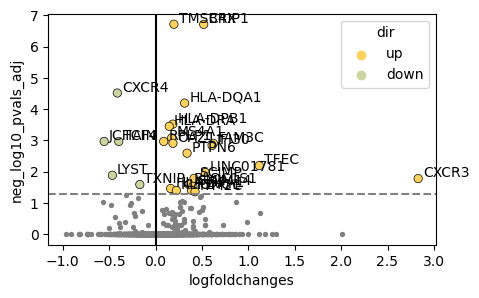

In [221]:
# plot volcano
matplotlib.rcParams['pdf.fonttype'] = 42 

wilcox_df['neg_log10_pvals_adj'] = -np.log10(wilcox_df['pvals_adj'])
wilcox_df = wilcox_df[wilcox_df['pct_nz_group']> 0.05]
wilcox_df['significant'] = ['sig' if p < 0.05 else 'ns' for p in wilcox_df['pvals_adj']]
wilcox_df['dir'] = ['up' if lfc > 0 else 'down' for lfc in wilcox_df['logfoldchanges']]

palette = ['#FFD359', '#CBD49C']

plt.figure(figsize=(5,3))
sns.scatterplot(data = wilcox_df, x = 'logfoldchanges', y = 'neg_log10_pvals_adj', color = 'grey',  edgecolor = None, linewidth = 0, s = 15)
sns.scatterplot(data = wilcox_df[wilcox_df['significant'] == 'sig'], x = 'logfoldchanges', y = 'neg_log10_pvals_adj', hue = 'dir', palette = palette, edgecolor = 'black', linewidth = 0.5)
plt.axhline(-np.log10(0.05), 0, 5, linestyle ='dashed', color = 'grey')
plt.axvline(0, 0, 5, color = 'black')

# label sign genes
for i, row in wilcox_df[wilcox_df['significant'] == 'sig'].iterrows():
    plt.text(row['logfoldchanges'] + 0.05 , row['neg_log10_pvals_adj'] + 0.05, row['names'])
plt.savefig('figures/CXCR3_B_mem_volcano.pdf') 

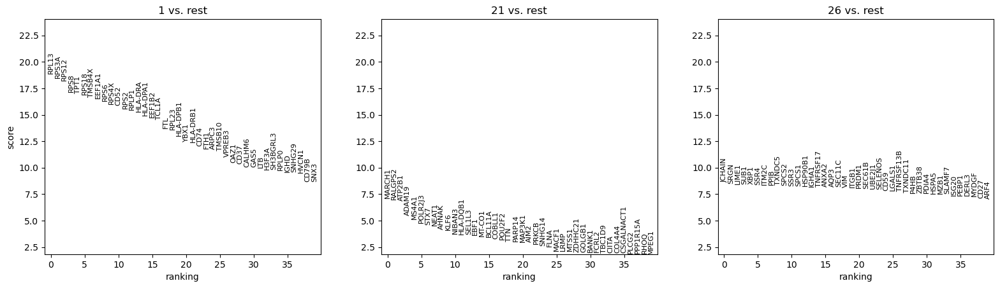

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


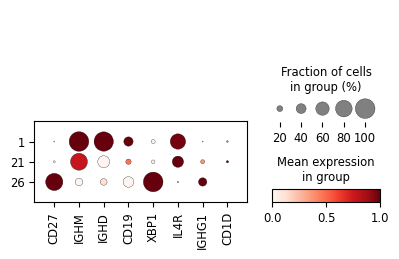

In [84]:
# subset on remaining B cells and annotate
adata_B = adata[adata.obs['leiden'].isin(['26', '1', '21']), :].copy()
sc.tl.rank_genes_groups(adata_B, groupby = 'leiden', method = 'wilcoxon')
sc.pl.rank_genes_groups(adata_B, n_genes = 40)
adata_B.obs['cell_subset'] = adata_B.obs['leiden'].map({'21': 'Naive B cells', '1': 'Naive B cells', '26': 'Plasmablasts'})
sc.pl.dotplot(adata_B, groupby = 'leiden', var_names = ['CD27', 'IGHM', 'IGHD', 'CD19', 'XBP1', 'IL4R', 'IGHG1', 'CD1D'], dendrogram = False, standard_scale = 'var')

In [80]:
# combine memory B cells and remaining B cells again
adata_B_com = adata_B.concatenate(adata_Bmem)
adata_B_com

Use anndata.concat instead of AnnData.concatenate, AnnData.concatenate is deprecated and will be removed in the future. See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html


AnnData object with n_obs × n_vars = 6299 × 5000
    obs: 'rna:n_genes_by_counts', 'rna:total_counts', 'rna:total_counts_mt', 'rna:pct_counts_mt', 'sample_id', 'sample_name', 'condition', '_scvi_batch', '_scvi_labels', 'leiden', 'cell_subset', 'batch'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_rank', 'variances', 'variances_norm', 'highly_variable_nbatches'
    obsm: 'X_pca', 'X_umap', 'X_scvi'
    layers: 'counts'

No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored


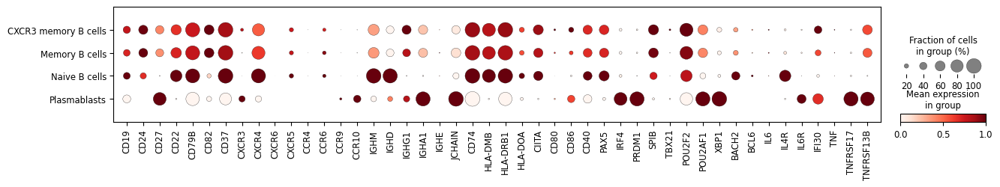

In [156]:
# plot dotplot
sc.pl.dotplot(adata_B_com, groupby = 'cell_subset', use_raw=False, standard_scale='var',
              var_names = ['CD19', 'CD24', 'CD27', 'CD22', 'CD79B', 'CD82', 'CD37', 'CXCR3', 'CXCR4', 'CXCR6', 'CXCR5', 'CCR4', 'CCR6', 'CCR9', 'CCR10', 'IGHM', 'IGHD', 'IGHG1', 'IGHA1', 'IGHE', 'JCHAIN', 'CD74', 'HLA-DMB', 'HLA-DRB1', 'HLA-DOA', 'CIITA', 'CD80', 'CD86', 'CD40',
                            'PAX5', 'IRF4', 'PRDM1', 'SPIB', 'TBX21', 'POU2F2', 'POU2AF1', 'XBP1', 'BACH2', 'BCL6', 'IL6', 'IL4R', 'IL6R', 'IFI30', 'TNF', 'TNFRSF17', 'TNFRSF13B'], 
            save ='dotplot_B_cells.pdf', figsize=(15, 2))

In [ ]:
# save adata
adata_B_com.write('../data/Gallopin_et_al/2023-12-15_adata_B_cells.h5ad')